In [1]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Revise
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Spinors/rmg_K.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/rmg_3pV.jl")

bc_sign_alpha_delta (generic function with 1 method)

This notebook is meant to be a comprehensive study of to what degree Berry Curvature reversal is possible within RMG.
- What regimes of physically realizable ($\alpha$, $\Delta$) produce $\Omega$ reversal?

In [2]:
# general parameters
pd = 50
mbz_kappa = 1
w = 10^(-1) * mbz_kappa
omega = exp(im * 2 * pi / 3)

-0.4999999999999998 + 0.8660254037844387im

In [3]:
# large \nu limit allows for convergence of \alpha, \Delta
nu = 50

50

In [4]:
# 3-patch parameters
vF = 0

0

<font size="12">$$(\Delta, \alpha) \ \mathrm{vs} \ \Omega^{3p}$$</font>

Here want to make a scatter plot that shows points of one color if Berry curvature is flipped and points of another color else.

In [5]:
Nl = 3

3

In [6]:
# Eigenvalue crossings happen every pi/3 = 1 phase of Delta. Want to move as far from crossing as possible
function origin_sign_alpha_delta(w, pd, m_kappa, Nl, nu)
    P = Figure(size=(2200, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))

    npts = 10^3
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))
    alph_angles = range(-pi, pi, npts)
    delt_angles = range(-pi, pi, npts)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = exp(im * ang1)
        delta = 10^(2) * exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[1, 1], title = L"|\Delta| = 10^{2} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[1, 2] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[1, 3], title = L"|\Delta| = |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[1, 4] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 52.113844856945775 * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[2, 1], title = L"|\Delta| = \frac{1}{50} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[2, 2] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 10^(2) * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[2, 3], title = L"|\Delta| = 10^{-2} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[2, 4] = Legend(P, ax1, framevisible = true)
    
    P
end



origin_sign_alpha_delta (generic function with 1 method)

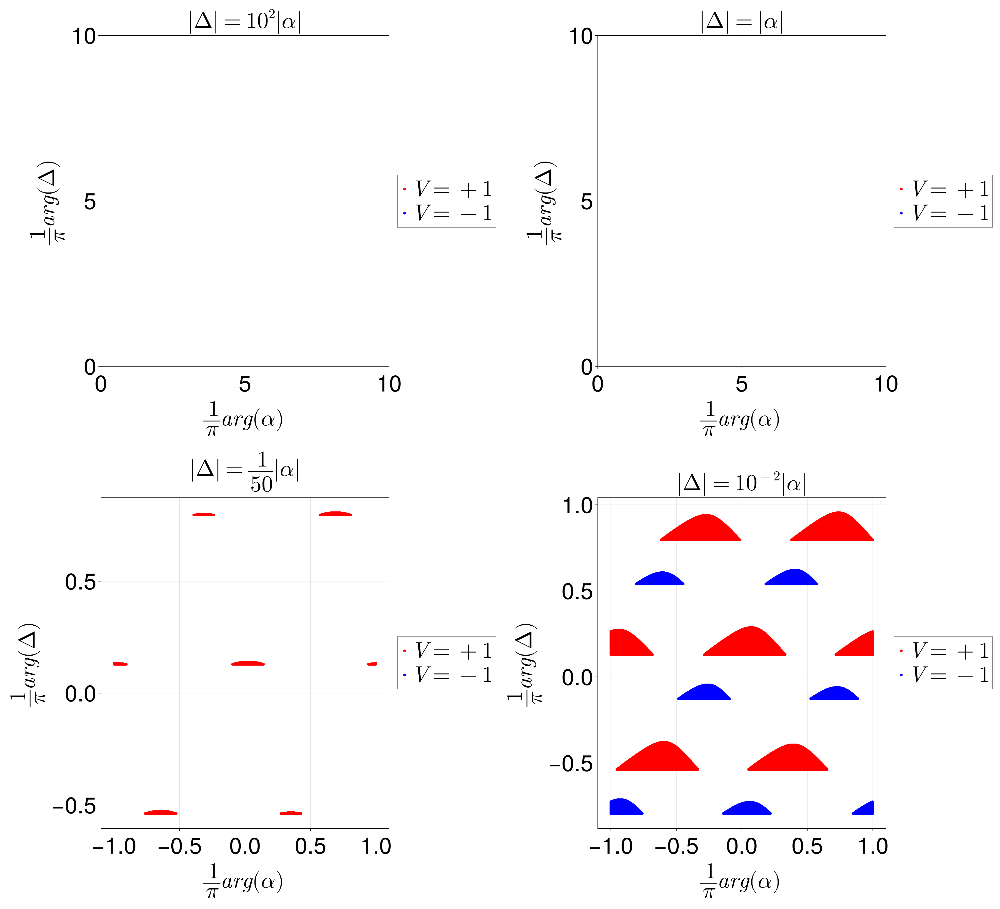

In [7]:
origin_sign_alpha_delta(w, pd, mbz_kappa, Nl, nu)

<font size="12">$$(\Delta, \alpha) \ \mathrm{vs} \ \Omega^{3p} \ \text{(large } \alpha \ \text{regime)}$$</font>

In [8]:
function origin_sign_alpha_delta_big_alpha(w, pd, m_kappa, Nl, nu)
    P = Figure(size=(2200, 2000), fontsize=50, fonts = (; regular = "italic", weird = "bold"))

    npts = 10^3
    spacing = 10^(-2) * (w / 2 / pd)
    grid = reshape([10^(-16), 10^(-16)], (1, 2))
    alph_angles = range(-pi, pi, npts)
    delt_angles = range(-pi, pi, npts)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 10^(3) * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[1, 1], title = L"|\Delta| = 10^{-3} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[1, 2] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 10^(4) * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[1, 3], title = L"|\Delta| = 10^{-4} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[1, 4] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 10^(6) * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[2, 1], title = L"|\Delta| = 10^{-6} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[2, 2] = Legend(P, ax1, framevisible = true)

    rev_points = Point2f[]
    ord_points = Point2f[]
    for ang1 in alph_angles, ang2 in delt_angles
        alpha = 10^(8) * exp(im * ang1)
        delta = exp(im * ang2)
        rev = true
        # Account for degeneracies
        if abs(ang2 - 0) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 - 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        elseif abs(ang2 + 2*pi/3) <= 0.4
            alpha = -alpha
            delta = -delta
            rev = false
        end
        if bc_sign_alpha_delta(m_kappa, spacing, Nl, nu, alpha, delta, [10^(-16), 10^(-16)]) == true
            if rev == true
                push!(rev_points, Point2f(1/pi * ang1, 1/pi * ang2))
            else
                push!(ord_points, Point2f(1/pi * ang1, 1/pi * ang2))
            end
        end
    end
    ax1 = Axis(P[2, 3], title = L"|\Delta| = 10^{-8} |\alpha|", xlabel = L"\frac{1}{\pi}arg(\alpha)", 
    ylabel = L"\frac{1}{\pi} arg(\Delta)")
    scatter!(ax1, rev_points, color=:red, markersize=8, label = L"V = +1")
    scatter!(ax1, ord_points, color=:blue, markersize=8, label = L"V = -1")
    P[2, 4] = Legend(P, ax1, framevisible = true)
    
    P
end



origin_sign_alpha_delta_big_alpha (generic function with 1 method)

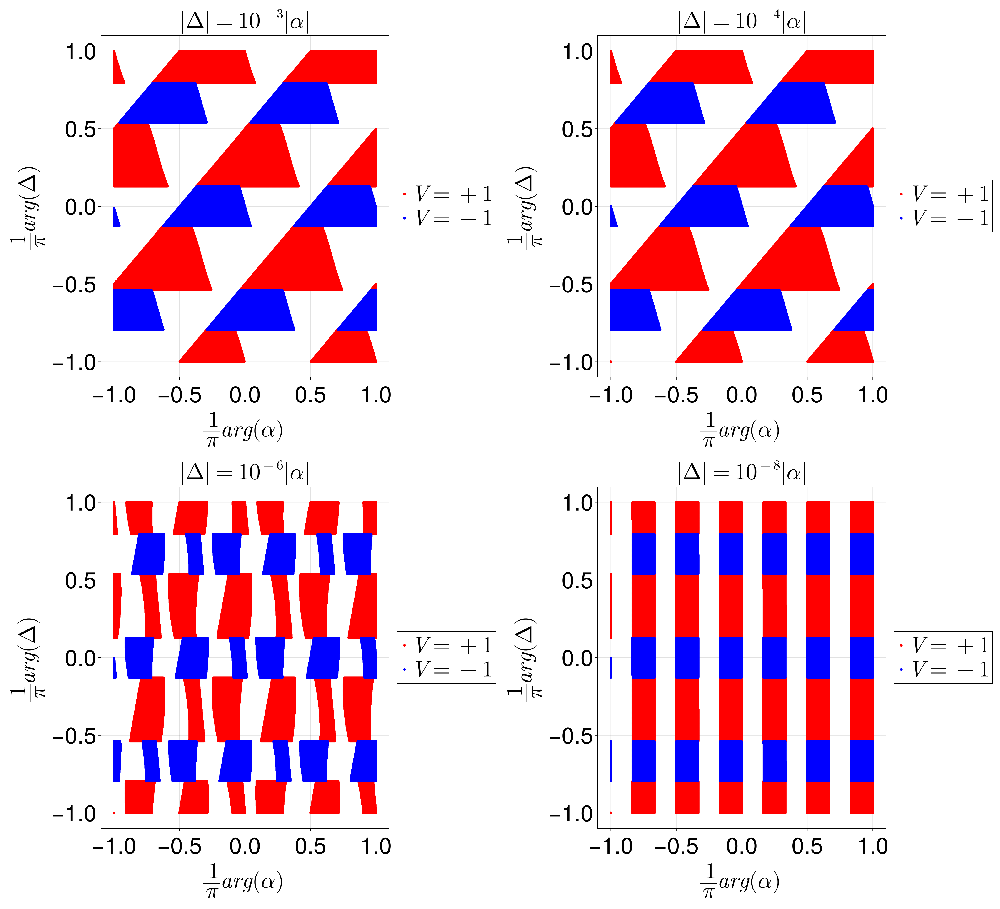

In [9]:
origin_sign_alpha_delta_big_alpha(w, pd, mbz_kappa, Nl, nu)

<font size="12">$$N_L \text{-Layer Potential}$$</font>

In [10]:
# 3-patch parameters
vF = 3

3

In [11]:
function rmg_bc_spacing_all(Nl_list, nu, m_kappa, vF, w, pd)
    temp_list = range(0, 3, 10^3)
    spacing_list = 10 .^(temp_list)


    curvature_1 = Array{Float64}(undef, length(spacing_list))
    curvature_2 = Array{Float64}(undef, length(spacing_list))

    P = Figure(size=(2700, 2300), fontsize=30)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        delta = -rmg_delta_all(m_kappa, nu, Nl)
        alpha = -rmg_alpha_all(m_kappa, nu, Nl)
        for i in 1:length(spacing_list)
            spacing = (w / 2 / pd) / spacing_list[i]
            grid = reshape([10^(-3), 10^(-3)], (1, 2))

            curvature_1[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax1, spacing_list, curvature_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax2, spacing_list, curvature_2)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)
    P
end

rmg_bc_spacing_all (generic function with 1 method)

In [12]:
# parameters
Nl_list = [2, 3, 4, 5]

4-element Vector{Int64}:
 2
 3
 4
 5

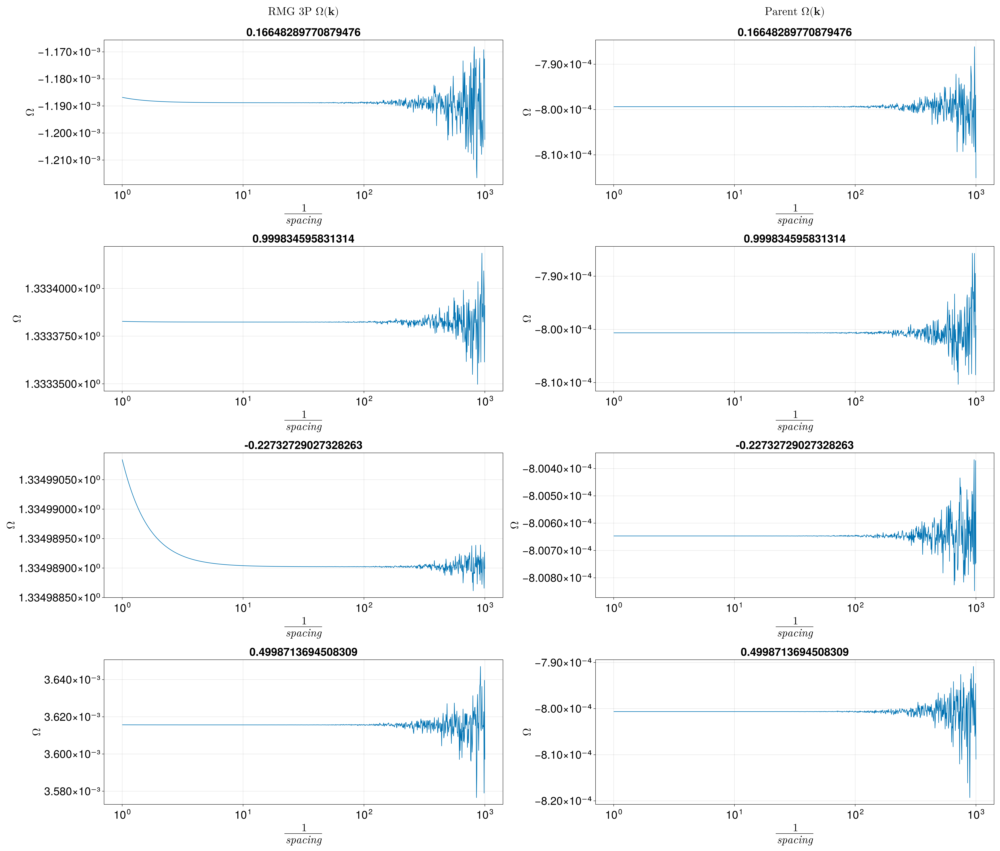

In [13]:
rmg_bc_spacing_all(Nl_list, nu, mbz_kappa, vF, w, pd)

In [14]:
function rmg_bc_vF_all(Nl_list, nu, m_kappa, w, pd)
    vF_list = range(0, 5, 10^3)
    spacing = 10^(-1) * (w / 2 / pd)
    curvature_1 = Array{Float64}(undef, length(vF_list))
    curvature_2 = Array{Float64}(undef, length(vF_list))

    P = Figure(size=(2700, 2300), fontsize=30)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        delta = -rmg_delta_all(m_kappa, nu, Nl)
        alpha = -rmg_alpha_all(m_kappa, nu, Nl)
        for i in 1:length(vF_list)
            vF = vF_list[i]
            grid = reshape([10^(-16), 10^(-16)], (1, 2))
            curvature_1[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"v_F", ylabel = L"\Omega")
        lines!(ax1, vF_list, curvature_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"v_F", ylabel = L"\Omega")
        lines!(ax2, vF_list, curvature_2)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)
    P
end

rmg_bc_vF_all (generic function with 1 method)

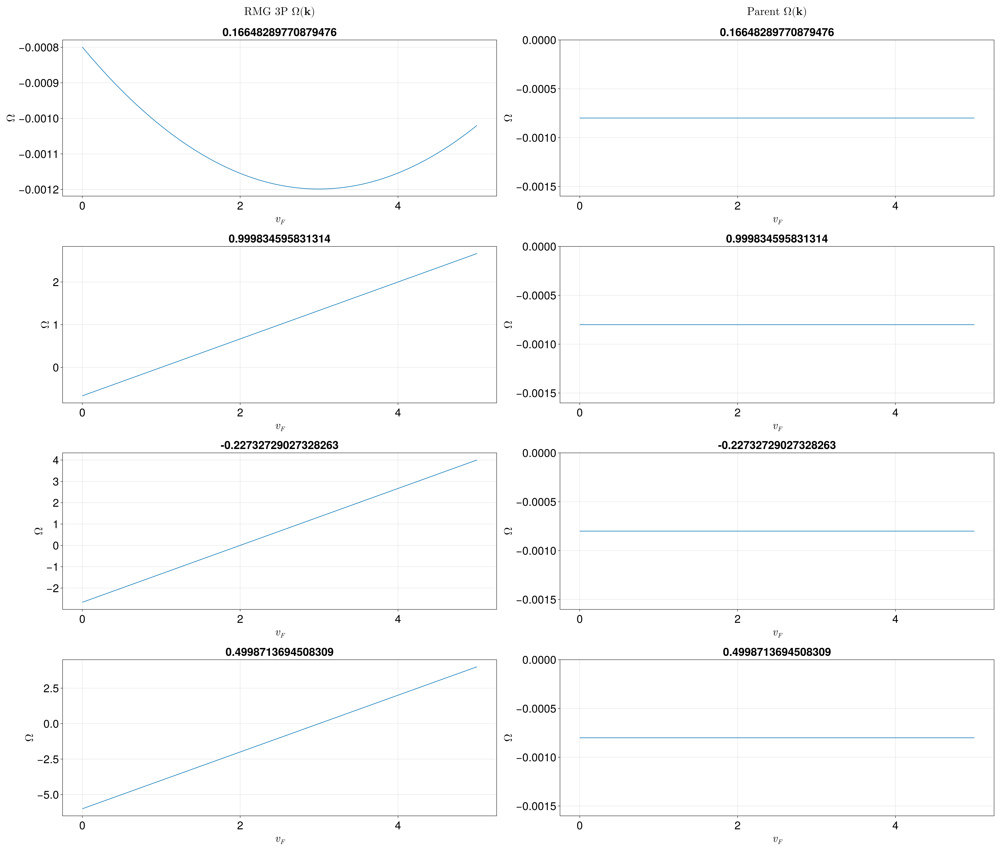

In [15]:
rmg_bc_vF_all(Nl_list, nu, mbz_kappa, w, pd)

In [16]:
function rmg_contour_all(Nl_list, nu, m_kappa, vF, w, pd)
    # get an mBZ centered at the kappa-point
    grid = make_hex([10^(-16), 10^(-16)], w / 2, w / 2 / pd)

    spacing = 10^(-1) * (w / 2 / pd)

    fig = Figure(size=(1600, 800 * length(Nl_list)), fontsize=25)

    for j in 1:length(Nl_list)
        Nl = Nl_list[j]
        delta = -rmg_delta_all(m_kappa, nu, Nl)
        alpha = -rmg_alpha_all(m_kappa, nu, Nl)
        orig = reshape([10^(-16), 10^(-16)], (1, 2))

        spinor_bc = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)

        patch_bc = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)
        
        ax1 = Axis(fig[j, 1], title = string("N_L = ")*string(Nl_list[j]), 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = title = string("N_L = ")*string(Nl_list[j])
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{RMG Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)

    fig
end

rmg_contour_all (generic function with 1 method)

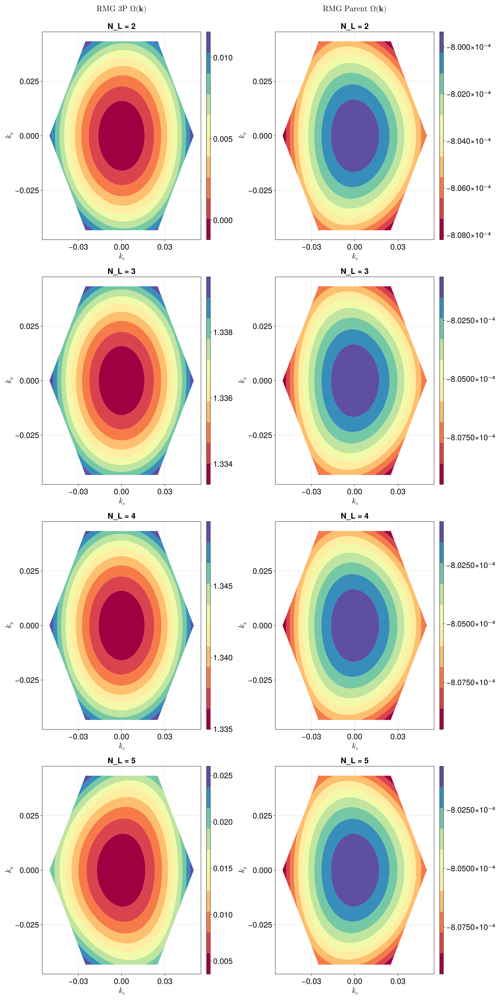

In [17]:
rmg_contour_all(Nl_list, nu, mbz_kappa, vF, w, pd)

<font size="12">$$1 \text{-Layer Potential}$$</font>

In [18]:
Nl = 3

3

In [19]:
# 3-patch parameters
vF = 5

5

In [20]:
function rmg_bc_spacing_1l(Nl, nu, m_kappa, vF, w, pd)
    temp_list = range(0, 3, 10^3)
    spacing_list = 10 .^(temp_list)
    Nl_list = collect(1:Nl)

    curvature_1 = Array{Float64}(undef, length(spacing_list))
    curvature_2 = Array{Float64}(undef, length(spacing_list))

    P = Figure(size=(2700, 2300), fontsize=30)

    for j in 1:Nl
        delta = -rmg_delta_layers(m_kappa, nu, Nl, [j])
        alpha = -rmg_alpha_layers(m_kappa, nu, Nl, [j])
        for i in 1:length(spacing_list)
            spacing = (w / 2 / pd) / spacing_list[i]
            grid = reshape([10^(-1), 10^(-1)], (1, 2))

            curvature_1[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax1, spacing_list, curvature_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"\frac{1}{spacing}", ylabel = L"\Omega", xscale = log10)
        lines!(ax2, spacing_list, curvature_2)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)
    P
end

rmg_bc_spacing_1l (generic function with 1 method)

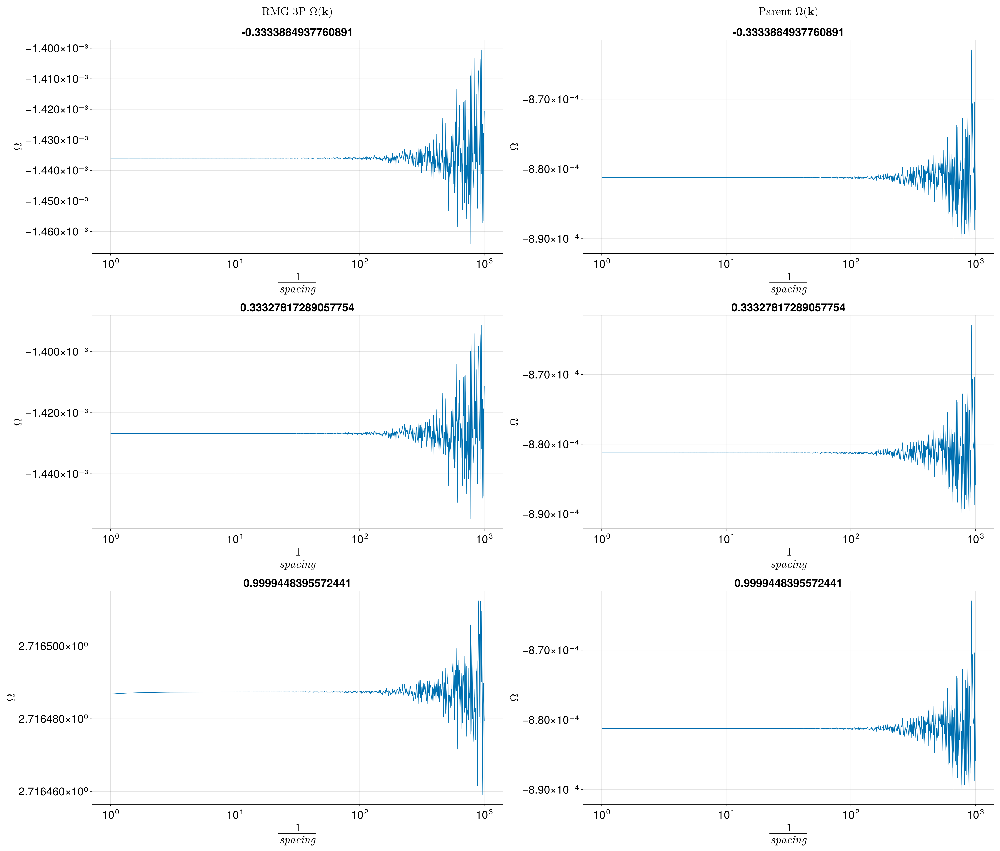

In [21]:
rmg_bc_spacing_1l(Nl, nu, mbz_kappa, vF, w, pd)

In [22]:
function rmg_bc_vF_layers(Nl, nu, m_kappa, w, pd)
    vF_list = range(0, 5, 10^3)
    Nl_list = collect(1:Nl)
    spacing = 10^(-1) * (w / 2 / pd)
    curvature_1 = Array{Float64}(undef, length(vF_list))
    curvature_2 = Array{Float64}(undef, length(vF_list))

    P = Figure(size=(2700, 2300), fontsize=30)

    for j in 1:Nl
        delta = -rmg_delta_layers(m_kappa, nu, Nl, [j])
        alpha = -rmg_alpha_layers(m_kappa, nu, Nl, [j])
        for i in 1:length(vF_list)
            vF = vF_list[i]
            grid = reshape([10^(-16), 10^(-16)], (1, 2))
            curvature_1[i] = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)[1]
            curvature_2[i] = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)[1]
        end
        ax1 = Axis(P[j, 1], title = string(angle(alpha) / pi), xlabel = L"v_F", ylabel = L"\Omega")
        lines!(ax1, vF_list, curvature_1)
        ax2 = Axis(P[j, 2], title = string(angle(alpha) / pi), xlabel = L"v_F", ylabel = L"\Omega")
        lines!(ax2, vF_list, curvature_2)
    end
    axs1 = Axis(P[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs1, label = false)
    hidespines!(axs1)

    axs2 = Axis(P[:, 2], title = L"\text{Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(axs2, label = false)
    hidespines!(axs2)
    P
end

rmg_bc_vF_layers (generic function with 1 method)

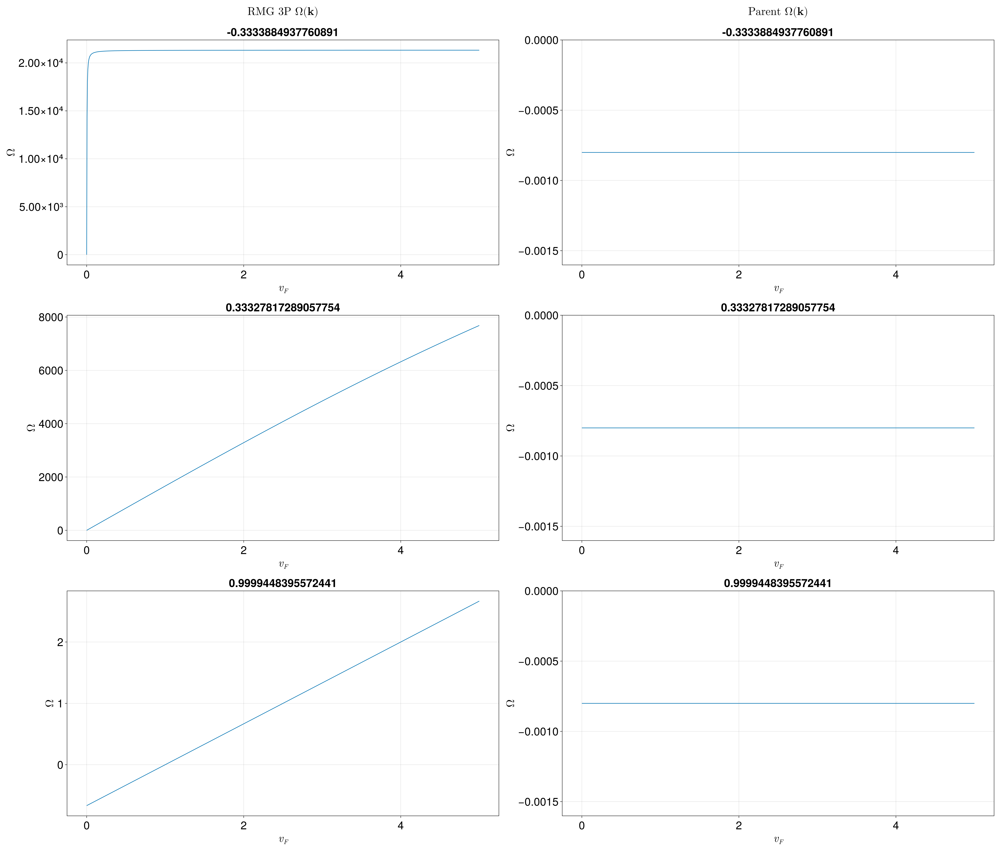

In [23]:
rmg_bc_vF_layers(Nl, nu, mbz_kappa, w, pd)

In [24]:
function rmg_contour_layers(Nl, nu, m_kappa, vF, w, pd)
    # get an mBZ centered at the kappa-point
    grid = make_hex([10^(-16), 10^(-16)], w / 2, w / 2 / pd)

    spacing = 10^(-1) * (w / 2 / pd)

    Nl_list = collect(1:Nl)

    fig = Figure(size=(1600, 800 * Nl), fontsize=25)

    for j in 1:Nl
        delta = -rmg_delta_layers(m_kappa, nu, Nl, [j])
        alpha = -rmg_alpha_layers(m_kappa, nu, Nl, [j])

        spinor_bc = rmg_equal_weighted_sum_bc(grid, spacing, Nl, nu, m_kappa)

        patch_bc = rmg_patch_bc(grid, spacing, Nl, nu, m_kappa, vF, delta, alpha)

        ax1 = Axis(fig[j, 1], title = string("l = ")*string(j), 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], patch_bc, colormap = :Spectral)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = title = string("l = ")*string(j)
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        X, ax3, tr3 = tricontourf(grid[:, 1], grid[:, 2], spinor_bc, colormap = :Spectral)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{RMG 3P } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{RMG Parent } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)
    
    fig
end

rmg_contour_layers (generic function with 1 method)

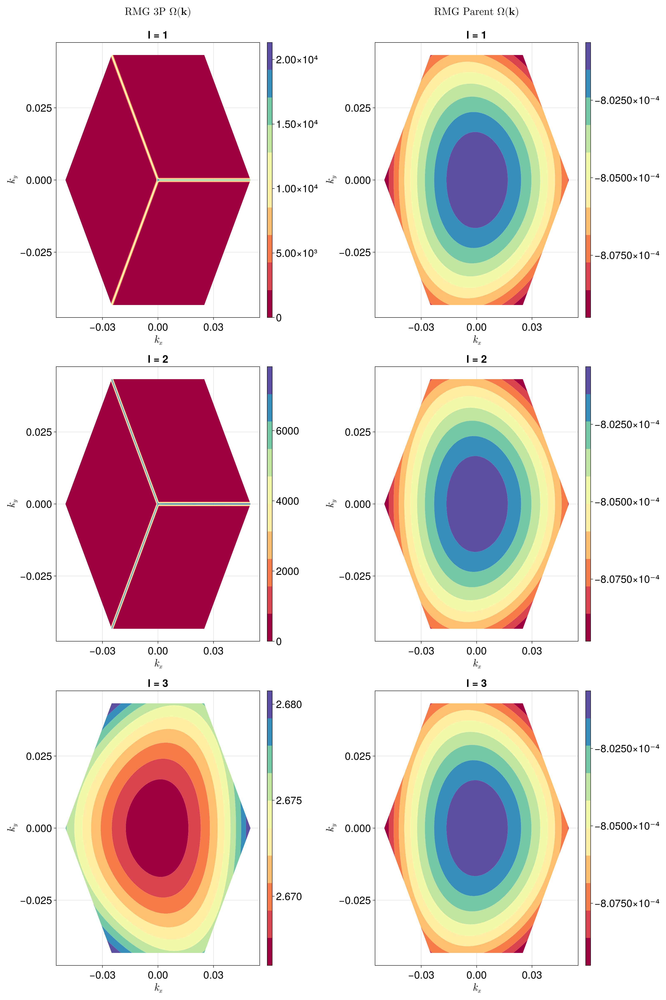

In [25]:
rmg_contour_layers(Nl, nu, mbz_kappa, vF, w, pd)